# Kaggle Landmark Retrieval Challenge

## Chapter 0: Overview of everything
### Dataset processing
- Images with no links are not considered part of "database"

### Observations
- 

### Model development
1. 
2. wejpew

### Results
- EFiefw

## Chapter 1: Dependencies and data loading

### Part 1: Libraries

In [69]:
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
# from PIL import Image
from random import randint

### Part 2: Directories

In [70]:
data_root = 'dataset'
index_dir = os.path.join(data_root, 'index-256')
train_dir = os.path.join(data_root, 'train-256')
test_dir = os.path.join(data_root, 'test')

csv_root = 'csv'
index_csv = os.path.join(csv_root, 'index.csv')
train_csv = os.path.join(csv_root, 'train.csv')
test_csv = os.path.join(csv_root, 'test.csv')

In [71]:
index_img = pd.read_csv(index_csv)
train_lbl = pd.read_csv(train_csv)
test_img = pd.read_csv(test_csv)

In [72]:
index_img.head()

,id,url
0,e08bbc99a449d6e6,http://lh3.ggpht.com/-0syNYGY8KGI/TM3Y0kKbgDI/...
1,d8adc613d77254d5,https://lh3.googleusercontent.com/-gvOm8lpizSQ...
2,bb4a99310d191a7a,http://lh5.ggpht.com/-2NdVC7qAtk4/SC9AW2SGWqI/...
3,be13e752a94e4bf2,http://lh3.ggpht.com/-FV8xeM7Xohk/RpTvuupcVQI/...
4,6af5a054b28468da,http://lh5.ggpht.com/-g3MdBD7f318/RzwDstaevTI/...


In [73]:
train_lbl.head()

,id,url,landmark_id
0,97c0a12e07ae8dd5,http://lh4.ggpht.com/-f8xYA5l4apw/RSziSQVaABI/...,6347
1,650c989dd3493748,https://lh5.googleusercontent.com/-PUnMrX7oOyA...,12519
2,05e63ca9b2cde1f4,http://mw2.google.com/mw-panoramio/photos/medi...,264
3,08672eddcb2b7c93,http://lh3.ggpht.com/-9fgSxDYwhHA/SMvGEoltKTI/...,13287
4,fc49cb32ef7f1e89,http://lh6.ggpht.com/-UGAXxvPbr98/S-jGZbyMIPI/...,4018


In [173]:
test_img.head()

,id,url
193,e8ca2759521e20af,http://lh3.googleusercontent.com/-ugeCbqMv0eo/...
231,b656a88e2a03cb7b,http://lh6.ggpht.com/_VIA2SA6Q7-8/TAkQBjZyktI/...
253,c329a108ad29404e,http://lh4.ggpht.com/-Ovjlyh_tlKE/RrbuicGEg9I/...
291,dbcc15bb551c2295,http://lh4.googleusercontent.com/-6omgNEvHyyg/...
324,a9639d56085cdaa6,http://lh3.googleusercontent.com/-LEsfSg_6Io8/...


### Part 3: Remove entries with no images

First we remove all rows that have `None` in the `url` entry since these images are not available.

We will reindex the `.csv` files so that we can query from them in an iterative order.

In [ ]:
index_img = index_img.reset_index()

In [185]:
test_img.head()

,id,url
193,e8ca2759521e20af,http://lh3.googleusercontent.com/-ugeCbqMv0eo/...
231,b656a88e2a03cb7b,http://lh6.ggpht.com/_VIA2SA6Q7-8/TAkQBjZyktI/...
253,c329a108ad29404e,http://lh4.ggpht.com/-Ovjlyh_tlKE/RrbuicGEg9I/...
291,dbcc15bb551c2295,http://lh4.googleusercontent.com/-6omgNEvHyyg/...
324,a9639d56085cdaa6,http://lh3.googleusercontent.com/-LEsfSg_6Io8/...


In [74]:
files = {
    'index': (index_img, index_dir),
    'train': (train_lbl, train_dir),
    'test': (test_img, test_dir)
}

### Part 4: Sample images from datasets

In [169]:
'''
Function to plot a grid of images
'''
def plot_grid(dataset_type, grid_x=5, grid_y=3, row_idx=None, incl_lbl=False):
    csv_file = files[dataset_type][0]
    img_dir = files[dataset_type][1]
    
    row_idx = np.array(row_idx) if row_idx else np.random.randint(len(csv_file), size=(grid_y, grid_x))
    row_idx = row_idx.reshape((grid_y, grid_x)) # in case we pass on a list
    
    for row in range(grid_y):
        for col in range(grid_x):
            filename = csv_file.loc[row_idx[row, col], 'id'] + '.jpg'
            path = os.path.join(img_dir, filename)
            jpg_img = mpimg.imread(path)
            
            plt.subplot(grid_y, grid_x, row*grid_x + col + 1) # '351'
            plt.
            plt.imshow(jpg_img)
            
    return plt

Index set

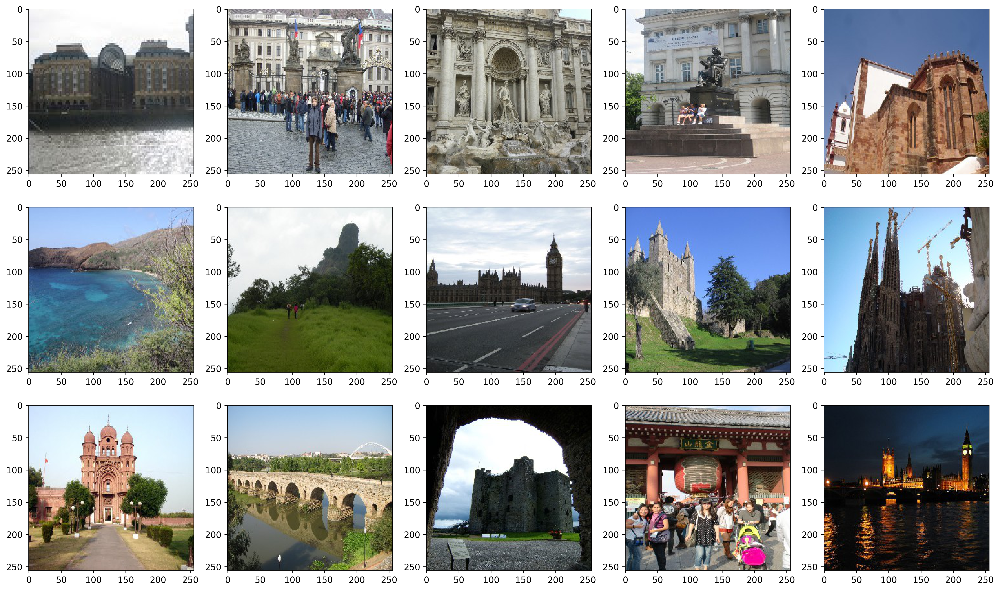

In [143]:
plt.figure(figsize=(20, 12), dpi=330)
plot_grid('index', grid_x=5, grid_y=3)
plt.show()

Training set

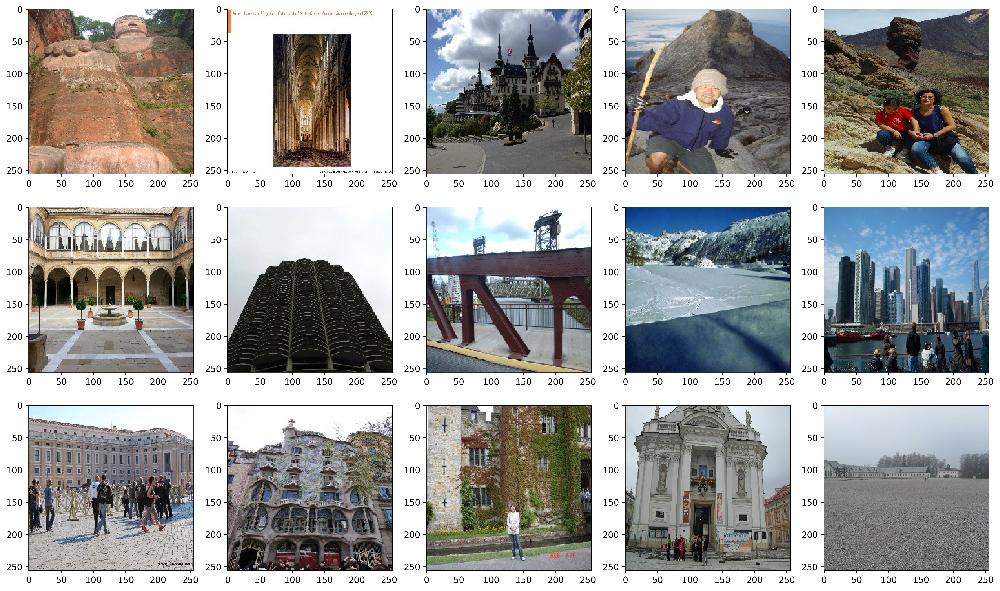

In [144]:
plt.figure(figsize=(20, 12), dpi=330)
plot_grid('train', grid_x=5, grid_y=3)
plt.show()

Test set

In [171]:
plt.figure(figsize=(20, 12), dpi=330)
plot_grid('test', grid_x=5, grid_y=3)
plt.show()

KeyError: 'the label [23] is not in the [index]'

<Figure size 6600x3960 with 0 Axes>

## Chapter 2: Exploratory data analysis


### Part 1: In-class comparison
Let's check some of the images that belong to the same `landmark_id` and see how different/similar they are to one another. 

In [162]:
train_lbl_sorted = train_lbl.sort_values(by='landmark_id').reset_index()
files['train_sorted'] = (train_lbl_sorted, train_dir)
train_lbl_sorted.head()

,index,id,url,landmark_id
0,423271,a46e23a50971b2ae,http://lh3.ggpht.com/-Sh6ivfJthkY/TlfeUyfkShI/...,0
1,848959,39b042d9f98f8fc7,https://lh4.googleusercontent.com/-653xZR_j_Sk...,0
2,36207,4df132deb907f301,https://lh6.googleusercontent.com/-AaAeoj_icHY...,0
3,1200511,d4dd55b46006cc69,https://lh5.googleusercontent.com/-no4Cxl7eEtc...,0
4,381365,e9690aae80e21a23,https://lh5.googleusercontent.com/-7sSRpotfRYI...,0


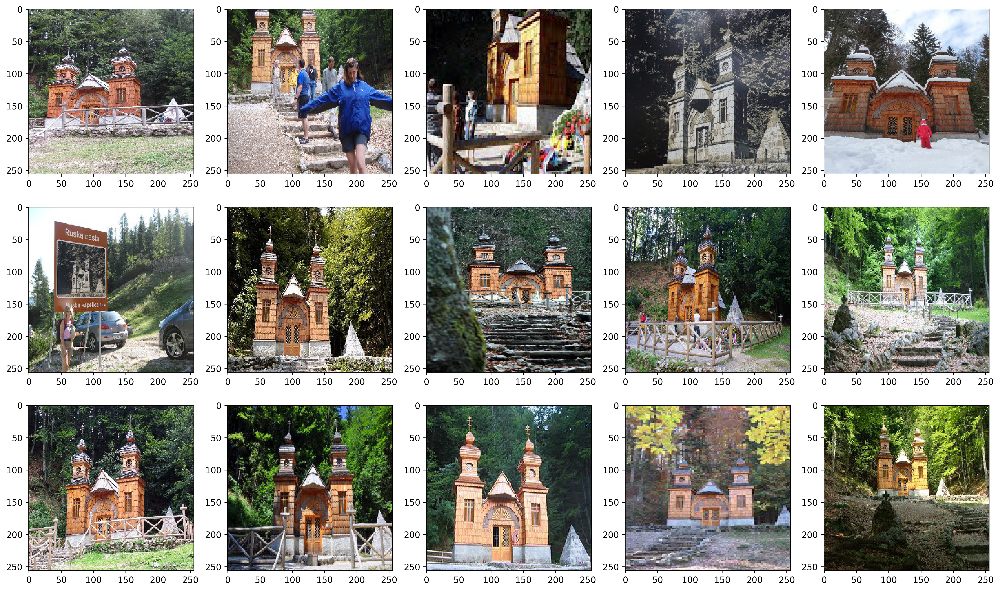

In [170]:
plt.figure(figsize=(20, 12), dpi=330)
plot_grid('train_sorted', row_idx=list(range(15)))
plt.show()

#### Some observations: 
- As we can see, in most of these pictures, the landmark (the building) is put in the center of the photos, and all have green background. One reasonable thing to try first is **pixel-to-pixel matching** based on euclidian distance between colors.

- Color pallette is slightly different across images (some are more bleak, some are black-and-white), so we might have a second match criterion based on **contrast** (by converting image to black-and-white and normalizing it).

- Because the buildings are not always exactly in the middle, we should try a **neighbor-consideration** matching that sets a non-zero weight if a pixel of one image matches well to a neighboring pixel in another image. We can use something like an radial-basis function to determine the distance.

- Pictures are taken at different angles -- it would be hard to compare front of the building and side of it. However, assuming there is an "intermediary" picture (maybe a diagonal view of the building), we can use [**query expansion**](https://www.kaggle.com/c/landmark-retrieval-challenge/discussion/57855#latest-481840). This method allows us to extrapolate that if pictures $A$ and $B$ are one object, and $B$ and $C$ are one object, then $A$ and $C$ are one object.

### Part 2: Out-of-class comparison

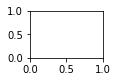

In [105]:
plt.subplot(4, 4, 16)

### Part 3: How do test images look like?

## Chapter 3: Building models

### Part 1: Performance metrics